In [211]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import math
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import datetime

## load

In [310]:
df = pd.read_csv('/Users/mabel/Downloads/114-1/ML&FinTech/project/data with 3 flags.csv', low_memory=False)

In [311]:
def get_columns_by_dtype(df):
    result = {}
    for dtype, cols in df.columns.to_series().groupby(df.dtypes).groups.items():
        result[str(dtype)] = cols.tolist()
    return result

In [312]:
cols_by_type = get_columns_by_dtype(df)
print(cols_by_type)

{'int64': ['gvkey', 'fyr', 'fyrc', 'fyear', 'sic', 'closest flag', 'after flag include', 'Delist_Flag'], 'float64': ['cik', 'exchg', 'acco', 'acdo', 'aco', 'acodo', 'acominc', 'acox', 'acoxar', 'act', 'aedi', 'aldo', 'ao', 'aocidergl', 'aociother', 'aocipen', 'aocisecgl', 'aodo', 'aox', 'ap', 'apb', 'apc', 'apofs', 'arb', 'arc', 'artfs', 'at', 'bkvlps', 'ca', 'caps', 'ceq', 'ceql', 'ceqt', 'ch', 'che', 'chs', 'cld2', 'cld3', 'cld4', 'cld5', 'clfc', 'clfx', 'clg', 'clis', 'cll', 'cllc', 'clo', 'clrll', 'clt', 'cmp', 'crv', 'crvnli', 'cstk', 'cstkcv', 'dc', 'dclo', 'dcom', 'dcpstk', 'dcs', 'dcvsr', 'dcvsub', 'dcvt', 'dd', 'dd1', 'dd2', 'dd3', 'dd4', 'dd5', 'dfpac', 'dfs', 'dlc', 'dlto', 'dltp', 'dltsub', 'dltt', 'dm', 'dn', 'dpacre', 'dpact', 'dpdc', 'dpltb', 'dpsc', 'dpstb', 'dptb', 'dptc', 'dptic', 'dpvieb', 'drc', 'drci', 'drlt', 'ds', 'dudd', 'dvpa', 'dxd2', 'dxd3', 'dxd4', 'dxd5', 'ea', 'esopct', 'esopdlt', 'esopnr', 'esopr', 'esopt', 'excadj', 'fatb', 'fatc', 'fate', 'fatl', 'fatn'

In [313]:
df['datadate'] = pd.to_datetime(df['datadate'], errors='coerce')
df['year'] = df['datadate'].dt.year

In [314]:
Text_all_var = ['datafmt','consol','cusip','cik','fic','indfmt','curcd','tic','datadate','conm','Delisting Date','gvkey','fyear','permno_gvkey','year']

In [315]:
df['year'] = df['year'].astype("str")
df['gvkey'] = df['gvkey'].astype("str")

In [316]:
Text_var = ['datadate','gvkey','year']

In [317]:
categorical_all_vars = [
    "fyr",          # Fiscal Year-end Month
    "fyrc",         # Current Fiscal Year End Month
    'closest flag', # List/Delist Status Marker
    "dummy_costat",       # Active/Inactive Status Marker
    "exchg",         # Stock Exchange Code
    'sic',           #standard industry classification
    'Delist_Flag',   # Any company that has been delisted is marked as 1
    'after flag include'    # The year after the company delisted is marked as 1
]

In [318]:
df = df.rename(columns={'costat': 'dummy_costat'})
df['dummy_costat'] = df['dummy_costat'].replace({'A': 0, 'I': 1}).astype("Int64")

/var/folders/ff/jq6xc_c933jg460z_rffdg380000gn/T/ipykernel_90682/1720777024.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['dummy_costat'] = df['dummy_costat'].replace({'A': 0, 'I': 1}).astype("Int64")


In [319]:
catrgorical_vars = ['dummy_costat','Delist_Flag','sic','closest flag','after flag include']

In [320]:
continuous_vars = [col for col in df.columns if col not in categorical_all_vars + Text_all_var ]

In [321]:
final_cols = catrgorical_vars + continuous_vars + Text_var
data = df[final_cols]

## data type visualization

In [322]:
var_counts = {
    'Categorical': len(catrgorical_vars),
    'Text': len(Text_var),
    'Continuous': len(continuous_vars)
}

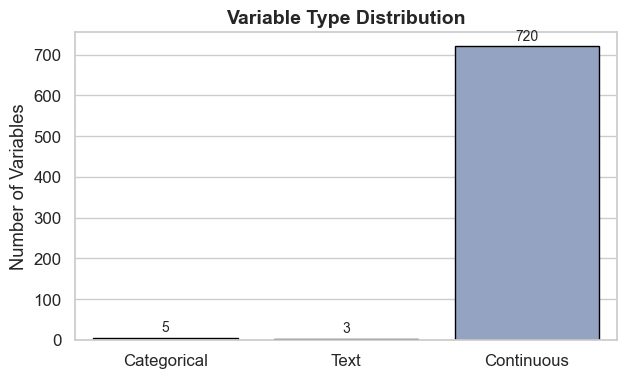

In [323]:
var_df = pd.DataFrame(list(var_counts.items()), columns=['Variable Type', 'Count'])
sns.set(style="whitegrid", font_scale=1.1)

plt.figure(figsize=(7, 4))
ax = sns.barplot(
    data=var_df,
    x='Variable Type',
    y='Count',
    hue='Variable Type',       # 新增 hue
    palette='Set2',
    legend=False,              # 不顯示圖例
    edgecolor='black'
)

# 顯示數值標籤
for i, v in enumerate(var_df['Count']):
    ax.text(i, v + (max(var_df['Count']) * 0.01), str(v), ha='center', va='bottom', fontsize=10)

plt.title('Variable Type Distribution', fontsize=14, fontweight='bold')
plt.ylabel('Number of Variables')
plt.xlabel('')
plt.savefig('/Users/mabel/Downloads/114-1/ML&FinTech/project/eda fig/variable_type_distribution.png', dpi=300, transparent=True)
plt.show()

## Missing

In [324]:
# show missing value ratio
missing_ratio = data.isnull().mean().sort_values(ascending=False)
print("\nMissing value ratio in each column:")
print(missing_ratio)


Missing value ratio in each column:
uxinst                0.999982
glceeps               0.999947
pncad                 0.999947
pnca                  0.999947
glcep                 0.999947
                        ...   
Delist_Flag           0.000000
after flag include    0.000000
closest flag          0.000000
sic                   0.000000
year                  0.000000
Length: 728, dtype: float64


In [325]:
high_missing_cols = missing_ratio[(missing_ratio == 1.0 ) | ( missing_ratio == 0)].index
high_missing_cols = high_missing_cols.difference(["year", "gvkey"])
data_drop = data.drop(columns=high_missing_cols)


In [326]:
data_drop.shape

(56092, 722)

In [327]:
features = data_drop.columns
features

Index(['acco', 'acdo', 'aco', 'acodo', 'acominc', 'acox', 'acoxar', 'act',
       'aedi', 'aldo',
       ...
       'txbco', 'txbcof', 'txdc', 'txpd', 'uaoloch', 'udfcc', 'uois', 'xidoc',
       'gvkey', 'year'],
      dtype='object', length=722)

In [328]:
def build_missing_indicator(df, gvkey_col="gvkey", fyear_col="year"):
    df_indexed = df.set_index([gvkey_col, fyear_col])
    missing_df = df_indexed.isna().astype(int).reset_index()
    return missing_df


In [329]:
missing_indicator = build_missing_indicator(data_drop, gvkey_col="gvkey", fyear_col="year")

### missing visualization

In [330]:
import os
def plot_missing_scatter_sorted(
    missing_df, 
    gvkey_col="gvkey", 
    fyear_col="fyear", 
    group_size=100, 
    gvkey_limit=500,        # 🔹 新增：最多顯示公司數
    save_path=None, 
    show=True
):
    """
    缺失情況可視化（支持700+ features）
    - y 軸: 所有 features（依缺失率排序）
    - x 軸: gvkey (公司，每次 group_size 家)
    - 紅點: 缺失值
    - gvkey_limit: 最多顯示前 N 家公司（依 gvkey 排序）
    """
    df = missing_df.copy()
    df[gvkey_col] = df[gvkey_col].astype(int)
    
    # wide -> long
    melted = df.melt(
        id_vars=[gvkey_col, fyear_col], 
        var_name="feature", 
        value_name="missing_flag"
    )
    melted = melted[melted["missing_flag"] == 1].copy()

    years = sorted(melted[fyear_col].unique())

    for year in years:
        sub_year = melted[melted[fyear_col] == year].copy()

        # 🔹 依 gvkey 排序並選前 gvkey_limit 家
        gvkeys_all = sorted(sub_year[gvkey_col].unique())
        gvkeys_selected = gvkeys_all[:gvkey_limit]
        sub_year = sub_year[sub_year[gvkey_col].isin(gvkeys_selected)]

        # 計算每個 feature 的缺失率
        feat_order = (
            sub_year.groupby("feature")["missing_flag"]
            .mean()
            .sort_values(ascending=False)
            .index
        )
        sub_year["feature"] = pd.Categorical(
            sub_year["feature"], categories=feat_order, ordered=True
        )

        gvkeys = sorted(sub_year[gvkey_col].unique())
        n_groups = (len(gvkeys) + group_size - 1) // group_size

        for g in range(n_groups):
            gv_subset = gvkeys[g*group_size:(g+1)*group_size]
            sub = sub_year[sub_year[gvkey_col].isin(gv_subset)].copy()

            gvkey_to_idx = {k:i for i,k in enumerate(gv_subset)}
            sub.loc[:, "gv_idx"] = sub[gvkey_col].map(gvkey_to_idx)

            # 動態 figsize，適應700+ features
            width = max(12, 0.25 * len(gv_subset))
            height = max(10, 0.12 * len(feat_order))

            plt.figure(figsize=(width, height))
            plt.scatter(sub["gv_idx"], sub["feature"], s=5, c="red", alpha=0.4)

            plt.xticks(
                ticks=np.arange(len(gv_subset)), 
                labels=gv_subset, 
                rotation=90, 
                fontsize=6
            )
            plt.yticks(fontsize=6)
            plt.xlabel("gvkey (Company)")
            plt.ylabel("Feature (sorted by missingness)")
            plt.title(
                f"Missing Values - Year {year} "
                f"(Companies {g*group_size+1}–{min((g+1)*group_size, len(gvkeys))} of {gvkey_limit})"
            )
            plt.tight_layout()

            if save_path:
                os.makedirs(save_path, exist_ok=True)
                file_path = os.path.join(
                    save_path, 
                    f"missing_year_{year}_companies_{g*group_size+1}_{min((g+1)*group_size, len(gvkeys))}_of_{gvkey_limit}.png"
                )
                plt.savefig(file_path, dpi=300, bbox_inches="tight")

            if show:
                plt.show()
            else:
                plt.close()

In [331]:

plot_missing_scatter_sorted(
    missing_df=missing_indicator,
    gvkey_col="gvkey",
    fyear_col="year",
    group_size=250,
    gvkey_limit=250,
    save_path="/Users/mabel/Downloads/114-1/ML&FinTech/project/eda fig/missing scatter",
    show=True
)

### missing indicator

In [332]:
#drop 100% missing
missing100_cols = missing_ratio[missing_ratio == 1.0].index
data = data.drop(columns=missing100_cols)

In [333]:
def add_missing_indicators(df):
    """
    為每個含有缺值的欄位新增 dummy 欄位
    命名格式：dummy_{col}_missing
    """
    df_out = df.copy()

    # 🔹 使用顯式判斷，避免 Series truth value 錯誤
    cols_with_missing = [col for col in df.columns if df[col].isna().any().item()]

    # 🔹 建立指示變數 DataFrame
    indicators = {
        f"dummy_{col}_missing": df[col].isna().astype(int)
        for col in cols_with_missing
    }
    indicators_df = pd.DataFrame(indicators, index=df.index)

    # 🔹 合併
    df_out = pd.concat([df_out, indicators_df], axis=1)

    return df_out

In [334]:
data_with_indicators = add_missing_indicators(data)

## Frequency

### category

sic

In [335]:
data_with_indicators['sic'] = (data_with_indicators['sic'] // 100) * 100
select_sic = data_with_indicators.loc[data_with_indicators['closest flag'] == 1]

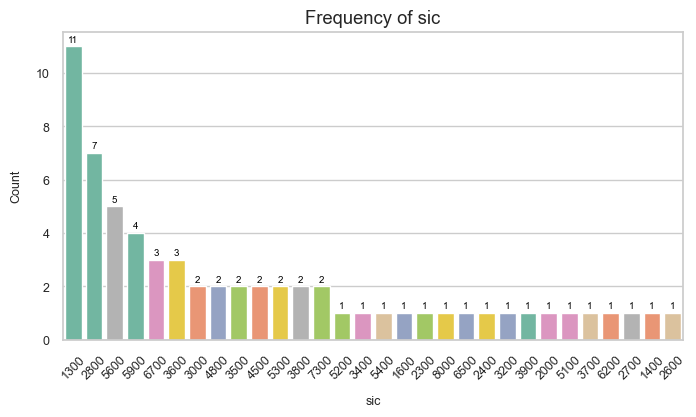

In [365]:
catrgorical_vars = ['sic']

for col in catrgorical_vars:
    plt.figure(figsize=(8,4))
    ax = sns.countplot(x=col, hue=col, data=select_sic, order=select_sic[col].value_counts().index, palette="Set2",legend=False )
    
    for p in ax.patches:
        ax.annotate(f"{int(p.get_height())}",  # type: ignore
                    (p.get_x() + p.get_width() / 2., p.get_height()),  # type: ignore
                    ha='center', va='center', fontsize=7, color='black', xytext=(0, 5),
                    textcoords='offset points')
        
        # 標題與軸標籤
    ax.set_title(f"Frequency of {col}", fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel(f"{col}", fontsize=9, labelpad=10)
    ax.set_ylabel("Count", fontsize=9, labelpad=10)

    # 軸刻度字體大小
    ax.tick_params(axis='x', labelsize=9, rotation=45)
    ax.tick_params(axis='y', labelsize=9)
    
    plt.title(f"Frequency of {col}")
    plt.savefig(f"/Users/mabel/Downloads/114-1/ML&FinTech/project/eda fig/{col}_frequency.png", dpi=300, bbox_inches="tight", transparent=True)
    plt.xticks(rotation=45)
    plt.show()

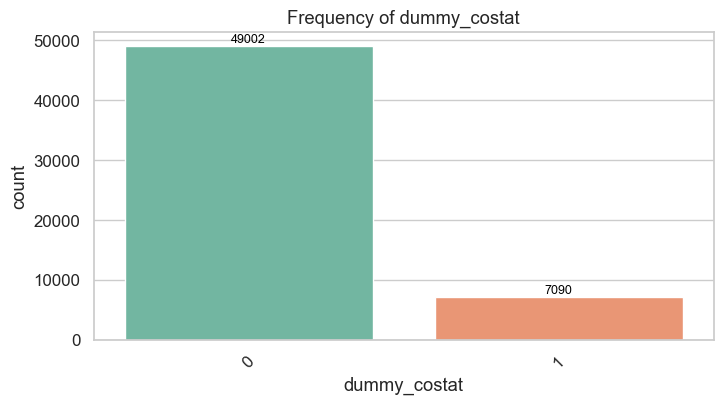

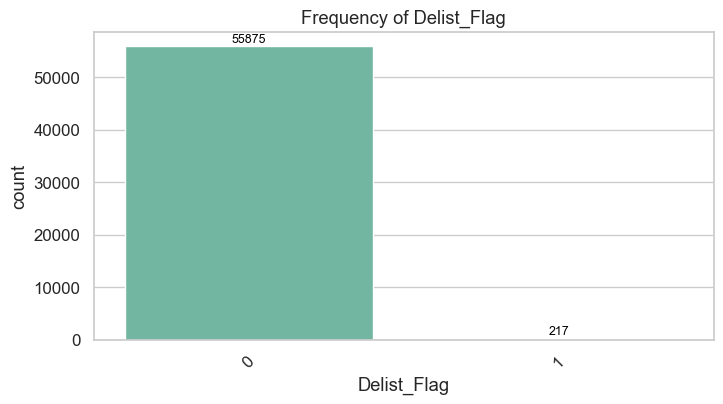

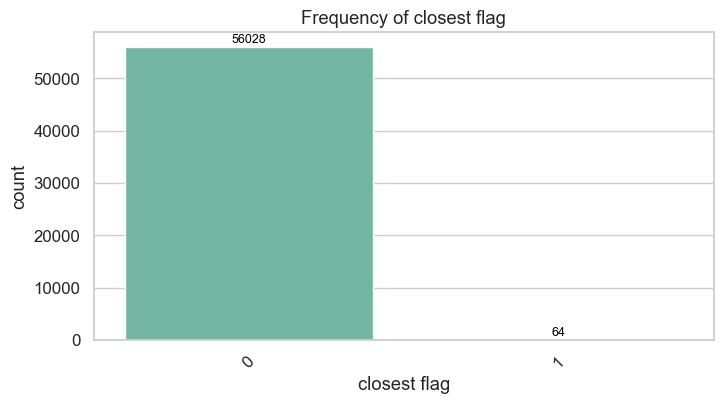

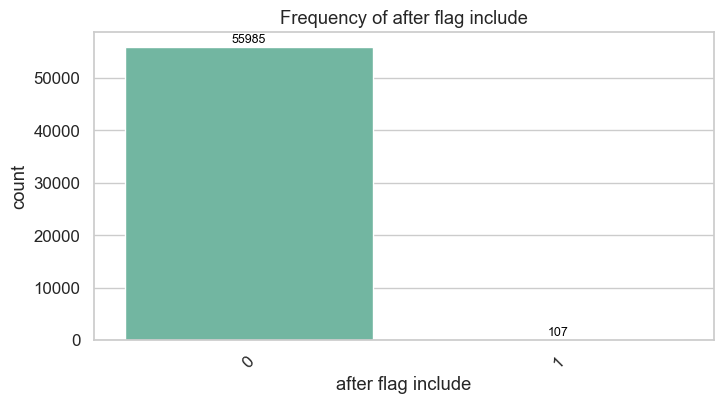

In [337]:
catrgorical_vars = ['dummy_costat','Delist_Flag','closest flag','after flag include']

for col in catrgorical_vars:
    plt.figure(figsize=(8,4))
    ax = sns.countplot(x=col, hue=col, data=data_with_indicators, order=data_with_indicators[col].value_counts().index, palette="Set2",legend=False )
    
    for p in ax.patches:
        ax.annotate(f"{int(p.get_height())}",  # type: ignore
                    (p.get_x() + p.get_width() / 2., p.get_height()),  # type: ignore
                    ha='center', va='center', fontsize=9, color='black', xytext=(0, 5),
                    textcoords='offset points')
    
    plt.title(f"Frequency of {col}")
    plt.savefig(f"/Users/mabel/Downloads/114-1/ML&FinTech/project/eda fig/{col}_frequency.png", dpi=300, bbox_inches="tight", transparent=True)
    plt.xticks(rotation=45)
    plt.show()

## continuous description summary

In [338]:
data_continuous_vars = data[[col for col in continuous_vars if col not in missing100_cols]]

def describe_continuous(df):
    desc = df.describe().T

    desc['skewness'] = df.skew(numeric_only=True)
    desc['kurtosis'] = df.kurt(numeric_only=True)

    desc = desc[['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max',
                 'skewness', 'kurtosis']]
    return desc

In [339]:
continuous_var_desc = describe_continuous(data_continuous_vars)
print(round(continuous_var_desc,4))

           count      mean        std      min       25%      50%      75%  \
acco      3159.0    0.0867     1.3876      0.0    0.0000   0.0000   0.0000   
acdo     26555.0    2.9071   111.1678      0.0    0.0000   0.0000   0.0000   
aco      27745.0  216.3040  2811.1354    -25.0    0.5710   6.4860  43.4110   
acodo    26605.0  192.4571  2855.4777    -25.0    0.0550   3.0320  26.4790   
acominc  30837.0 -150.1676  1235.4331 -47852.0  -11.3510   0.0000   0.0000   
...          ...       ...        ...      ...       ...      ...      ...   
txpd     24796.0  114.2835   728.5484  -7470.0    0.0260   2.9135  32.6950   
uaoloch   1200.0 -153.0806  1294.0406 -25024.0 -105.7780 -14.5055  16.9798   
udfcc      550.0   -0.6426    87.7116  -1393.0    0.0000   0.0000   0.0000   
uois      1200.0   28.9755   429.2612  -2860.0  -20.8365   2.2625  34.2778   
xidoc    30666.0    0.3057    93.6266  -7153.0    0.0000   0.0000   0.0000   

                max  skewness   kurtosis  
acco         35.329 

In [243]:
continuous_var_desc.to_excel('/Users/mabel/Downloads/114-1/ML&FinTech/project/year_continuous variable summary.xlsx',index=1) # type: ignore

## Outlier & Log

In [353]:
# 修改delist名稱 'closest flag', 'after flag include', 'Delist_Flag'

data_with_indicators = data_with_indicators.rename(columns={
    'closest flag': 'dummy_closest flag',
    'after flag include': 'dummy_Post_Delist_Year',
    'Delist_Flag': 'dummy_Delisted_Flag'
    })

data_with_indicators['sic'] = data_with_indicators['sic'].astype("str")

In [354]:
def check_outliers(df, threshold=3, plot=False, n_cols=5, n_show=20, dummy_keywords=["dummy"]):
    """
    用 Z-score 檢查 DataFrame 的「非 dummy」數值欄位是否有離群值，
    並輸出「前 n_show 個變數」的 boxplot（依欄位順序）。

    參數:
        df : DataFrame
        threshold : float, 判定離群的 Z-score 閾值 (預設=3)
        plot : bool, 是否畫出 boxplot (subplot 形式)
        n_cols : int, 每行 subplot 的數量
        n_show : int, 要顯示的變數數量（預設 20）
        dummy_keywords : list[str], dummy 欄位名稱中會包含的關鍵字

    回傳:
        outlier_summary : DataFrame（前 n_show 個變數的離群統計）
    """
    # 🔹 選出非 dummy 的數值欄位
    numeric_cols = [
        col for col in df.select_dtypes(include=[np.number]).columns
        if not any(key.lower() in col.lower() for key in dummy_keywords)
    ]

    # 取前 n_show 個變數
    selected_cols = numeric_cols[:n_show]

    summary_list = []

    for col in selected_cols:
        series = df[col].dropna()
        if series.std() == 0:  # 避免除以 0
            continue
        
        z_scores = stats.zscore(series)
        outlier_mask = np.abs(z_scores) > threshold
        outlier_count = outlier_mask.sum()
        outlier_pct = outlier_count / len(series) * 100
        
        summary_list.append({
            "feature": col,
            "n_obs": len(series),
            "outlier_count": outlier_count,
            "outlier_pct": round(outlier_pct, 2)
        })
    
    outlier_summary = pd.DataFrame(summary_list).set_index("feature")

    # ✅ 畫圖
    if plot and not outlier_summary.empty:
        n = len(outlier_summary)
        n_rows = math.ceil(n / n_cols)
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2.5), dpi=150)
        axes = axes.flatten()

        for i, col in enumerate(outlier_summary.index):
            sns.boxplot(y=df[col], ax=axes[i], color="skyblue")
            axes[i].set_title(f"{col}\nOutliers={outlier_summary.loc[col, 'outlier_count']}", fontsize=8)
            axes[i].tick_params(axis="x", labelsize=7)
            axes[i].tick_params(axis="y", labelsize=7)

        # 隱藏多餘 subplot
        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)

        plt.tight_layout()

        save_path = '/Users/mabel/Downloads/114-1/ML&FinTech/project/eda fig/outlier_boxplots.png'
        plt.savefig(save_path, dpi=300, bbox_inches="tight", transparent=True)
        plt.show()
    
    return outlier_summary

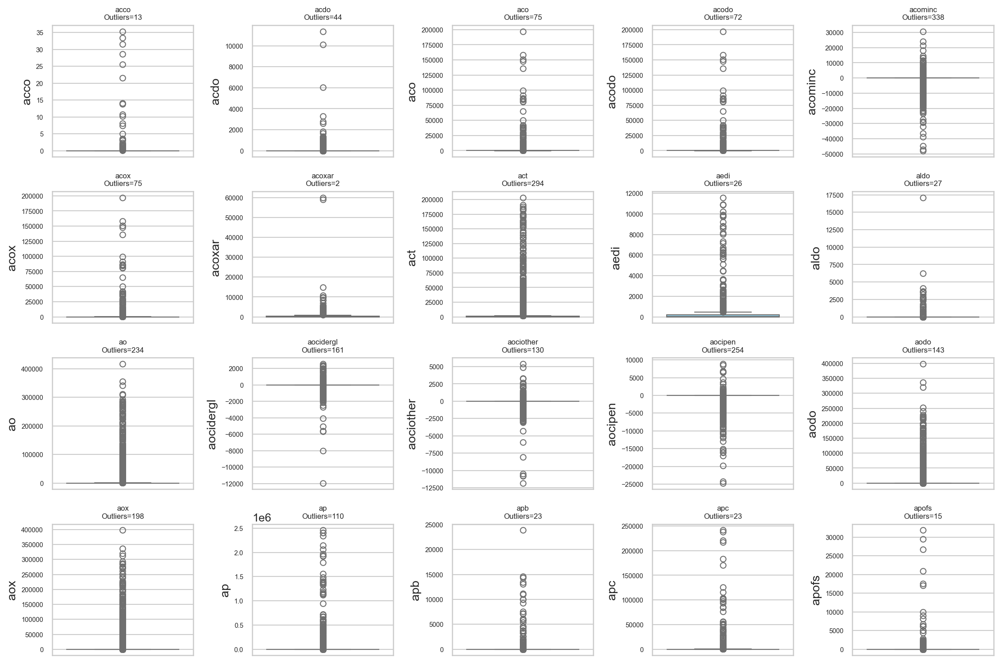

In [355]:
outlier_first20 = check_outliers(
    data_with_indicators, # 原始資料
    threshold=3,    # |Z| > 3 視為離群
    plot=True,      # 是否畫圖
    n_cols=5,       # 每行 5 張子圖
    n_show=21,      # 前 20 個變數
    dummy_keywords=["dummy"]  # 排除 dummy 欄位
)

### Log transformation

In [348]:
def log_transform(df, dummy_keywords=["dummy"], inplace=False):
    """
    對非 dummy 的數值欄位進行 log 轉換：
    - 若包含 <=0 → 自動平移使所有值 >0，然後取 log(x_shifted)
    - 自動跳過 NaN，但保留為 NaN
    - 適用含 0、NaN、負值的財務資料
    - 避免對 dummy 欄位進行轉換

    參數：
        df : DataFrame
        dummy_keywords : list[str]，dummy 欄位名稱中會包含的關鍵字
        inplace : bool，是否直接修改原始 df

    回傳：
        df_out : 轉換後的 DataFrame
        log_cols : 實際做 log 轉換的欄位清單
    """
    if not inplace:
        df = df.copy()

    # 1️⃣ 篩選數值欄位
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

    # 2️⃣ 排除 dummy 欄位
    non_dummy_cols = [
        col for col in numeric_cols
        if not any(key.lower() in col.lower() for key in dummy_keywords)
    ]

    log_cols = []
    print(f"🔍 準備對 {len(non_dummy_cols)} 個非 dummy 數值欄位進行 log 轉換...\n")

    for col in non_dummy_cols:
        series = df[col]

        if series.isna().all():
            # 即使全 NaN，也建立同名欄位（保持欄位結構一致）
            df[col] = np.nan
            continue

        # 3️⃣ 若最小值 <= 0，進行平移，使最小值略大於 0
        min_val = series.min(skipna=True)
        if min_val <= 0:
            shift = abs(min_val) + 1e-6
            transformed = np.log(series + shift)
        else:
            transformed = np.log(series)

        # 4️⃣ 保留 NaN
        df[col] = np.where(series.notna(), transformed, np.nan)
        log_cols.append(col)

        if len(log_cols) % 100 == 0:
            print(f"✅ 已完成 {len(log_cols)} 個欄位...")

    print(f"\n🎯 已完成所有 {len(log_cols)} 個欄位的 log 轉換。")
    return df, log_cols

In [349]:
df_log, transformed_cols = log_transform(data_with_indicators)

print(f"\n✅ 共 {len(transformed_cols)} 個變數已進行 log 轉換。")

🔍 準備對 720 個非 dummy 數值欄位進行 log 轉換...

✅ 已完成 100 個欄位...
✅ 已完成 200 個欄位...
✅ 已完成 300 個欄位...
✅ 已完成 400 個欄位...
✅ 已完成 500 個欄位...
✅ 已完成 600 個欄位...
✅ 已完成 700 個欄位...

🎯 已完成所有 720 個欄位的 log 轉換。

✅ 共 720 個變數已進行 log 轉換。


check outlier after log

In [350]:
def check_outliers_firstN(df_log, threshold=3, n_show=20, n_cols=5, dummy_keywords=["dummy"], save_path=None):
    """
    對非 dummy 的數值變數進行 Z-score 離群檢測，
    並自動畫出「前 n_show 個變數」的 boxplot（依欄位順序）。

    參數：
        df : DataFrame
        threshold : float，Z-score 閾值 (預設=3)
        n_show : int，要顯示的變數數量 (預設=20)
        n_cols : int，每行的 subplot 數量
        dummy_keywords : list[str]，dummy 欄位名稱中會包含的關鍵字
        save_path : str，可選，儲存圖片路徑

    回傳：
        outlier_summary : DataFrame（前 n_show 個變數的離群統計）
    """
    # 1️⃣ 篩選「非 dummy」數值欄位
    numeric_cols = [
        col for col in df.select_dtypes(include=[np.number]).columns
        if not any(key.lower() in col.lower() for key in dummy_keywords)
    ]

    # 只取前 n_show 個變數
    selected_cols = numeric_cols[:n_show]

    summary_list = []
    for col in selected_cols:
        series = df[col].dropna()
        if series.std() == 0:
            continue  # 跳過常數欄位

        z_scores = stats.zscore(series)
        outlier_mask = np.abs(z_scores) > threshold
        outlier_count = outlier_mask.sum()
        outlier_pct = outlier_count / len(series) * 100

        summary_list.append({
            "feature": col,
            "n_obs": len(series),
            "outlier_count": outlier_count,
            "outlier_pct": round(outlier_pct, 2)
        })

    outlier_summary = pd.DataFrame(summary_list).set_index("feature")

    # 2️⃣ 繪圖
    if not outlier_summary.empty:
        n = len(outlier_summary)
        n_rows = math.ceil(n / n_cols)
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2.5), dpi=150)
        axes = axes.flatten()

        for i, col in enumerate(outlier_summary.index):
            sns.boxplot(y=df[col], ax=axes[i], color="lightblue")
            axes[i].set_title(
                f"{col}\nOutliers={outlier_summary.loc[col,'outlier_count']}", 
                fontsize=8
            )
            axes[i].tick_params(axis="x", labelsize=7)
            axes[i].tick_params(axis="y", labelsize=7)

        # 隱藏多餘 subplot
        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches="tight", transparent=True)
            print(f"✅ Boxplot saved to: {save_path}")

        plt.show()

    return outlier_summary

✅ Boxplot saved to: /Users/mabel/Downloads/114-1/ML&FinTech/project/eda fig/outlier_boxplots_first20.png


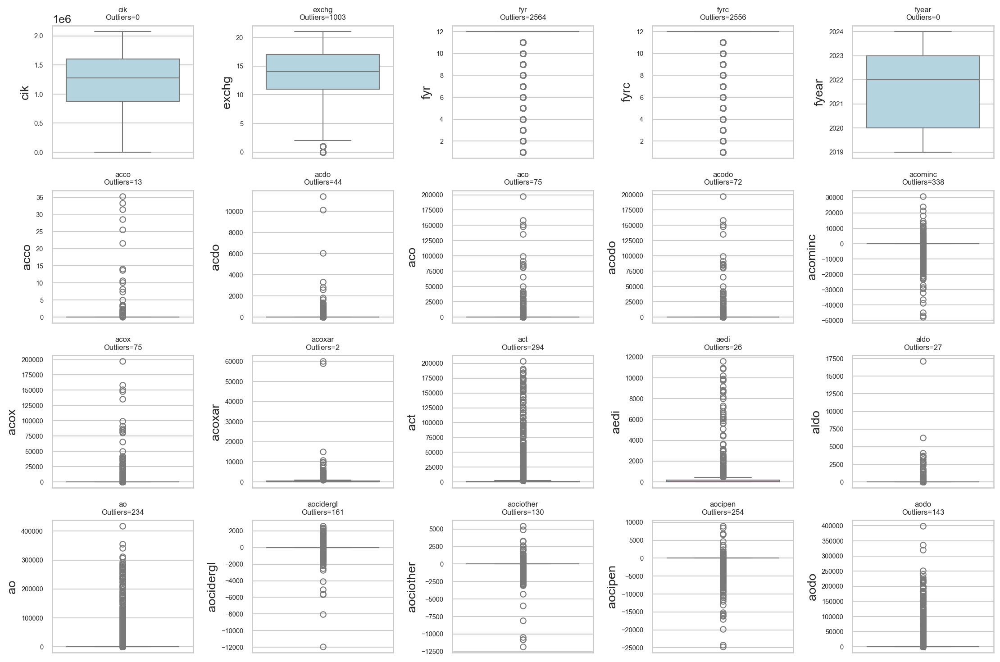

         n_obs  outlier_count  outlier_pct
feature                                   
cik      38545              0         0.00
exchg    56092           1003         1.79
fyr      56092           2564         4.57
fyrc     56092           2556         4.56
fyear    56092              0         0.00


In [352]:
outlier_first20 = check_outliers_firstN(
    df_log,
    threshold=3,
    n_show=21,  # 前 20 個變數
    n_cols=5,
    dummy_keywords=["dummy"],
    save_path="/Users/mabel/Downloads/114-1/ML&FinTech/project/eda fig/outlier_boxplots_first20.png"
)

print(outlier_first20.head())

## Pairscatter

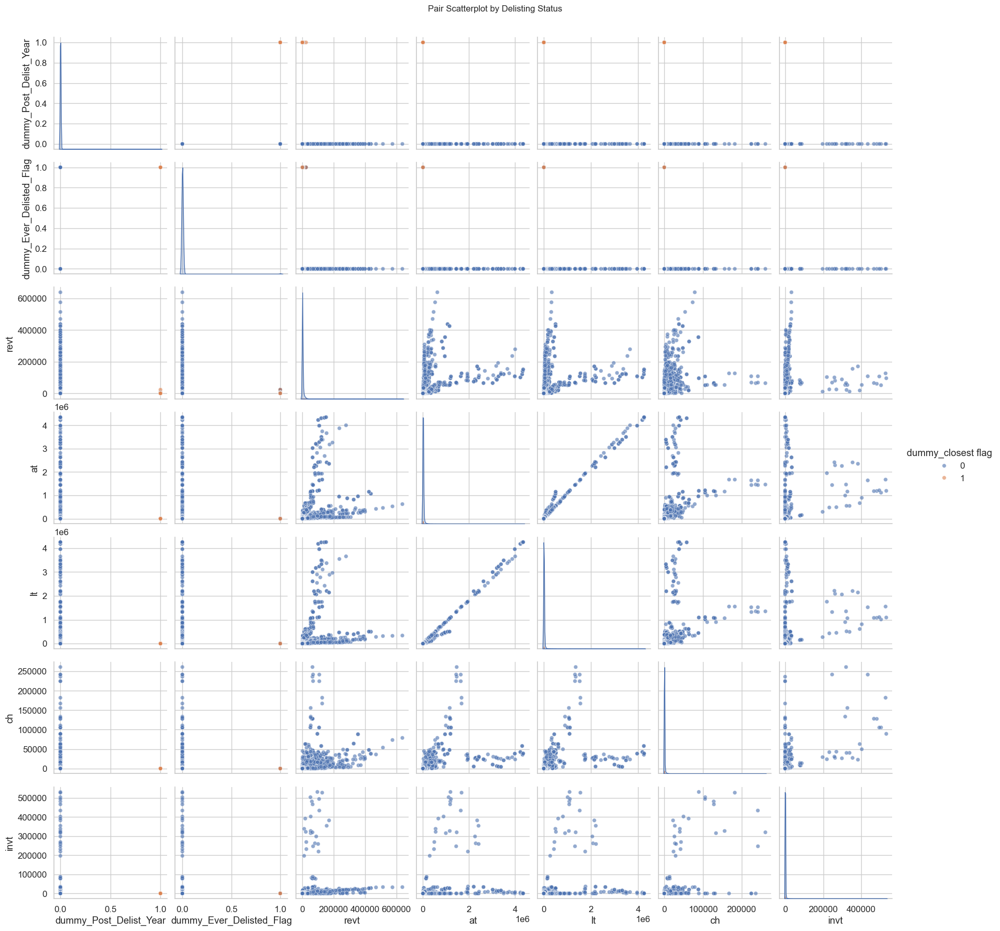

In [362]:
# 🔹 指定要比較的變數
vars_to_plot = ["revt", "at", "lt", "ch", "invt"] # 例如：營收、總資產、總負債、現金、存貨

# 🔹 建立 subset 資料
subset = data_with_indicators[["dummy_closest flag",'dummy_Post_Delist_Year','dummy_Ever_Delisted_Flag'] + vars_to_plot].dropna()

# 🔹 Pairplot：依 dummy_delist 顏色區分
sns.pairplot(
    subset,
    hue="dummy_closest flag",       # 依退市標記分色
    diag_kind="kde",          # 對角線顯示分布圖
    plot_kws={"alpha": 0.6, "s": 30, "edgecolor": "w"},
    corner=False              # 顯示完整上三角與下三角
)

plt.suptitle("Pair Scatterplot by Delisting Status", y=1.02, fontsize=12)
plt.savefig("/Users/mabel/Downloads/114-1/ML&FinTech/project/eda fig/pairplot_by_delisting_status.png", dpi=300, bbox_inches="tight", transparent=True)
plt.show()